I studied with notebook below.

https://www.kaggle.com/tanulsingh077/how-to-become-leaf-doctor-with-deep-learning

In [1]:
import sys
sys.path.append('../input/pytorch-image-models/pytorch-image-models-master')

In [2]:
# Preliminaries
import os
from pathlib import Path
import glob
from tqdm import tqdm
tqdm.pandas()
import json
import pandas as pd
import numpy as np

## Image hash
import imagehash

# Visuals and CV2
import seaborn as sn
import matplotlib.pyplot as plt
import cv2
from PIL import Image

# albumentations for augs
import albumentations
from albumentations.pytorch.transforms import ToTensorV2

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score

# Keras and TensorFlow
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array 
from keras.applications.resnet50 import preprocess_input 

# models 
from keras.applications.resnet50 import ResNet50
from keras.models import Model

#torch
import torch
import timm
import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import Dataset,DataLoader

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


## Utils

In [3]:
def plot_images(class_id, label, images_number, verbose=0):
    plot_list = train[train['label'] == class_id].sample(images_number)['image_id'].tolist()
    
    # Printing list of images
    if verbose:
        print(plot_list)
        
    labels = [label for i in range(len(plot_list))]
    size = np.sqrt(images_number)
    if int(size) * int(size) < images_number:
        size = int(size) + 1
        
    plt.figure(figsize=(20, 20))
    
    for idx, (image_id, label) in enumerate(zip(plot_list, labels)):
        plt.subplot(size, size, idx + 1)
        image = cv2.imread(str(BASE_DIR/'train_images'/image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.imshow(image)
        plt.title(label, fontsize=12)
        plt.axis('off')
        
    
    plt.show()

In [4]:
BASE_DIR = Path('../input/cassava-leaf-disease-classification')

# READING DATAFRAME HAVING LABELS
train = pd.read_csv(BASE_DIR/'train.csv')

# LABEL MAPPINGS
with open(BASE_DIR/'label_num_to_disease_map.json') as f:
    mapping = json.loads(f.read())
    mapping = {int(k): v for k, v in mapping.items()}
    

print(mapping)

{0: 'Cassava Bacterial Blight (CBB)', 1: 'Cassava Brown Streak Disease (CBSD)', 2: 'Cassava Green Mottle (CGM)', 3: 'Cassava Mosaic Disease (CMD)', 4: 'Healthy'}


In [5]:
train['label_names'] = train['label'].map(mapping)
train.head()

,image_id,label,label_names
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


In [6]:
train[train['label_names'] == 'Healthy']['image_id'].count()

2577

['778101302.jpg', '1305777482.jpg', '1310462986.jpg', '432656934.jpg', '423907510.jpg', '2191328263.jpg']


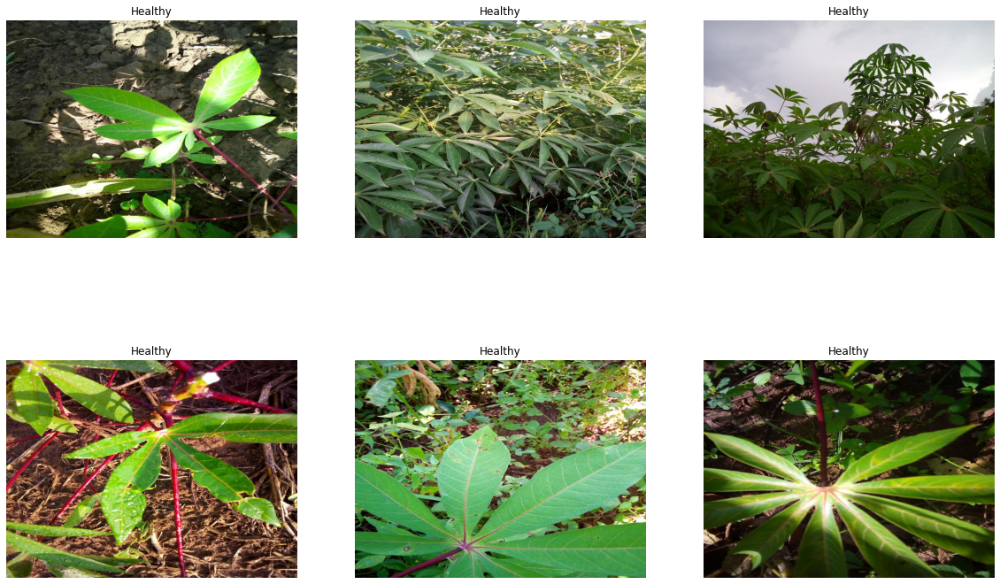

In [7]:
plot_images(class_id=4,
            label='Healthy',
            images_number=6,
            verbose=1)

In [8]:
def extract_features(image_id, model):
    file = BASE_DIR/'train_images'/image_id
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224, 224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img)
    # reshape the data for the model reshape(num_of_samples, dim1, dim2, chacnnels)
    reshaped_img = img.reshape(1, 224, 224, 3)
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    
    return features

In [9]:
model = ResNet50()
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

healthy = train[train['label'] == 4]
healthy['features'] = healthy['image_id'].progress_apply(lambda x: extract_features(x, model))

102973440/102967424 [==============================] - 1s 0us/step


100%|██████████| 2577/2577 [02:52<00:00, 14.92it/s]
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [10]:
features = np.array(healthy['features'].values.tolist()).reshape(-1, 2048)
# print(features)
image_ids = np.array(healthy['image_id'].values.tolist())

# Clustering
kmeans = KMeans(n_clusters=4, n_jobs=-1,random_state=22)
kmeans.fit(features)

/opt/conda/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


KMeans(n_clusters=4, n_jobs=-1, random_state=22)

In [11]:
groups = {}
for file, cluster in zip(image_ids, kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [12]:
def view_cluster(cluster):
    plt.figure(figsize=(25, 25))
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 25")
        start = np.random.randint(0, len(files))
        files = files[start:start+25]

    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(5, 5, index+1)
        img = load_img(BASE_DIR/'train_images'/file)
        img = np.array(img)
        plt.imshow(img)
        plt.title(file)
        plt.axis('off')

Clipping cluster size from 778 to 25


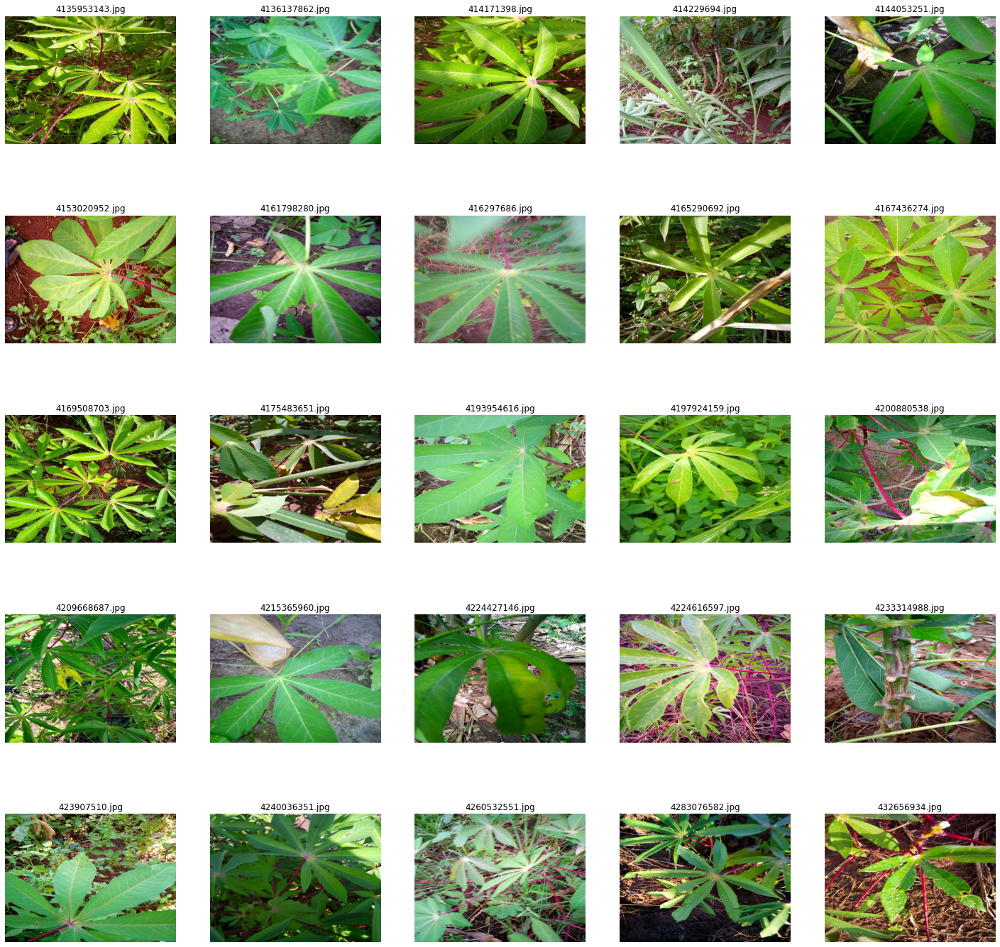

In [13]:
view_cluster(3)

['3687557580.jpg', '851450770.jpg', '1012426959.jpg', '3236562372.jpg', '3886831141.jpg', '718957379.jpg']


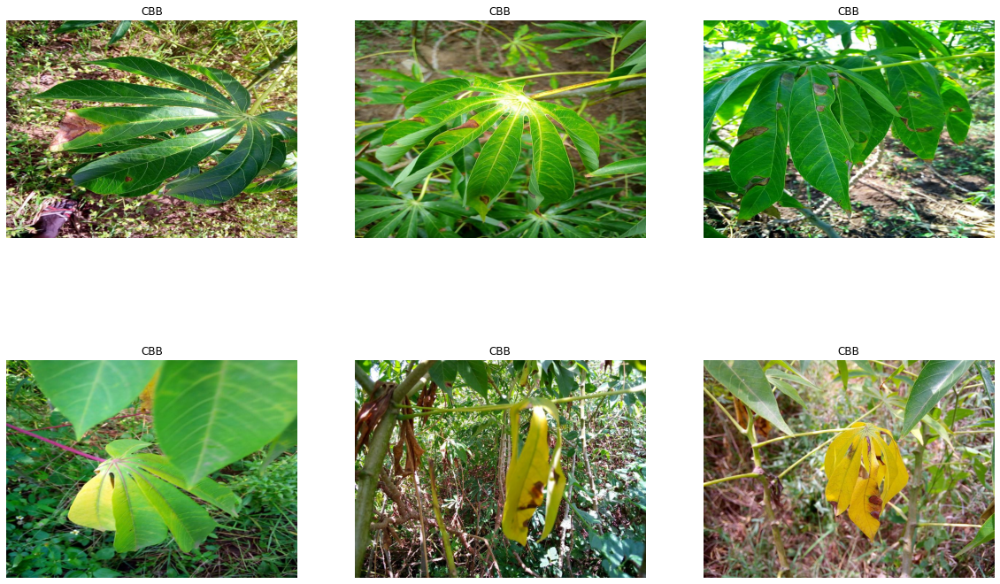

In [14]:
plot_images(class_id=0,
            label='CBB',
            images_number=6,
            verbose=1)

['2330146659.jpg', '2573573471.jpg', '3082545983.jpg', '3213680701.jpg', '1657183324.jpg', '2151050324.jpg', '644131683.jpg', '3650775304.jpg', '3095413567.jpg', '2867956908.jpg', '884267453.jpg', '1415244401.jpg']


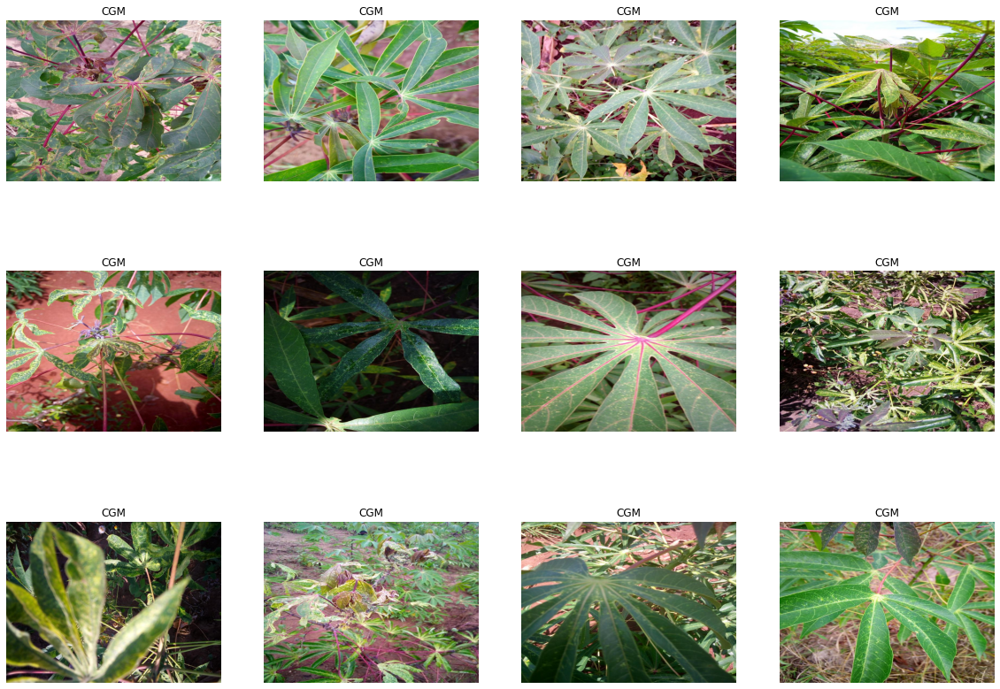

In [15]:
plot_images(class_id=2,
            label='CGM',
            images_number = 12,
            verbose = 1)

['1362645481.jpg', '3255212212.jpg', '3518716660.jpg', '3100860826.jpg', '220364890.jpg', '360692391.jpg']


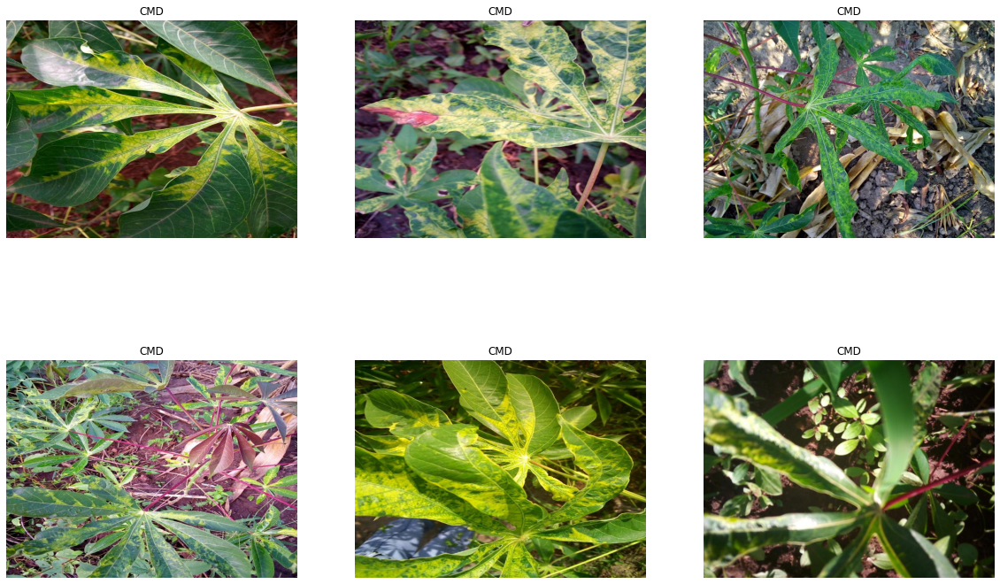

In [16]:
plot_images(class_id=3,
            label='CMD',
            images_number=6,
            verbose=1)

['1097323507.jpg', '2925605732.jpg', '1144686555.jpg', '3303586699.jpg', '4083768019.jpg', '2433057323.jpg', '1873204876.jpg', '1396114117.jpg', '2073193450.jpg', '709405326.jpg', '1814991024.jpg', '3508836759.jpg']


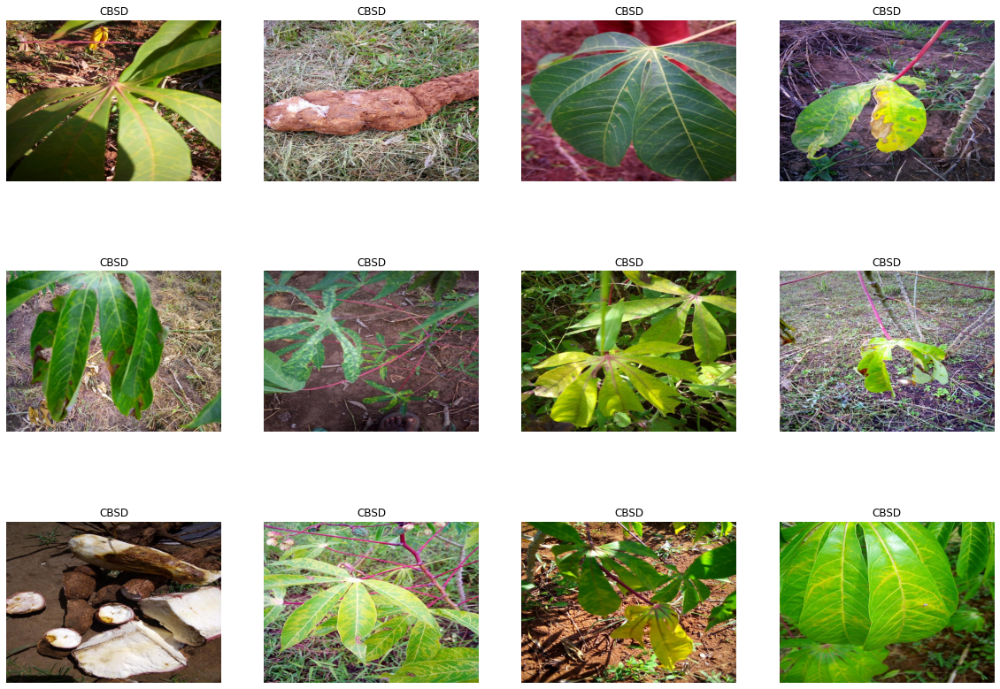

In [17]:
plot_images(class_id=1,
            label='CBSD',
            images_number=12,
            verbose=1)

In [18]:
CBSD = train[train['label']==1]
CBSD['features'] = CBSD['image_id'].progress_apply(lambda x: extract_features(x, model))

100%|██████████| 2189/2189 [02:25<00:00, 15.02it/s]
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [19]:
features_cbsd = np.array(CBSD['features'].values.tolist()).reshape(-1, 2048)
image_ids_cbsd = np.array(CBSD['image_id'].values.tolist())

# Clustering
kmeans_cbsd = KMeans(n_clusters=5, n_jobs=-1, random_state=22)
kmeans_cbsd.fit(features_cbsd)

/opt/conda/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


KMeans(n_clusters=5, n_jobs=-1, random_state=22)

In [20]:
groups_cbsd = {}
for file, cluster in zip(image_ids_cbsd, kmeans_cbsd.labels_):
    if cluster not in groups_cbsd.keys():
        groups_cbsd[cluster] = []
        groups_cbsd[cluster].append(file)
    else:
        groups_cbsd[cluster].append(file)

In [21]:
def view_cluster(cluster):
    plt.figure(figsize=(25, 25))
    # get the list of filenames for a cluster
    files = groups_cbsd[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 30:
        print(f"Clipping cluster size from {len(files)} to 25")
        start = np.random.randint(0, len(files))
        files = files[start:start+25]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(5, 5, index+1)
        img = load_img(BASE_DIR/'train_images'/file)
        img = np.array(img)
        plt.imshow(img)
        plt.title(file)
        plt.axis('off')

Clipping cluster size from 80 to 25


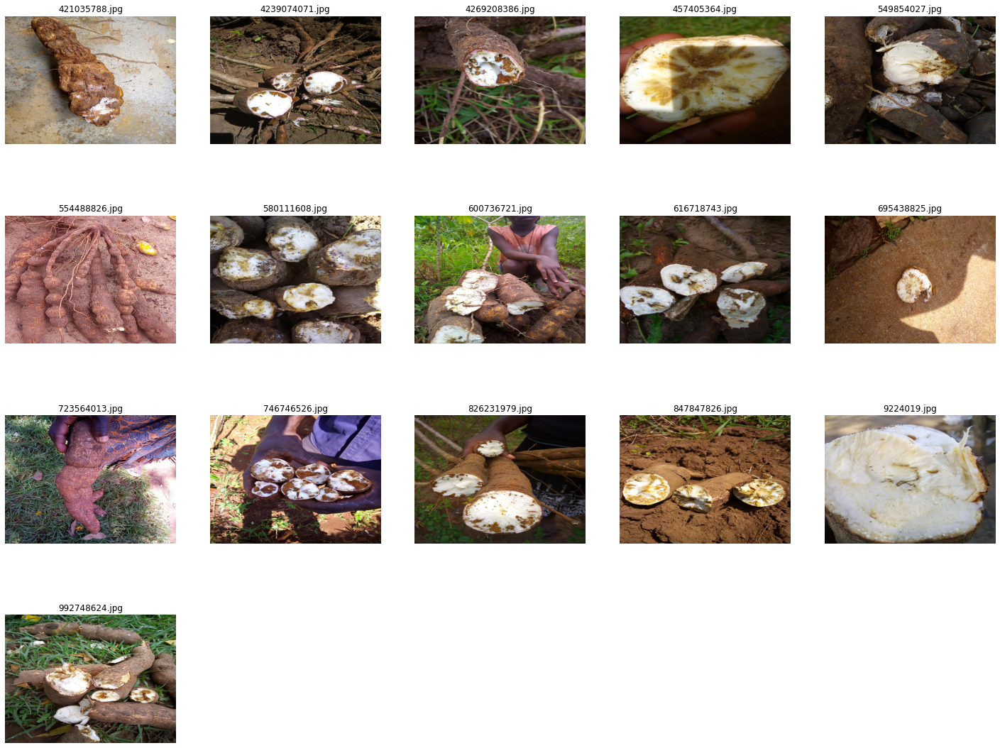

In [22]:
view_cluster(4)

In [23]:
funcs = [
    imagehash.average_hash,
    imagehash.phash,
    imagehash.dhash,
    imagehash.whash,
]

image_ids = []
hashes = []

for path in tqdm(glob.glob(str(BASE_DIR/'train_images'/'*.jpg'))):
    image = Image.open(path)
    image_id = os.path.basename(path)
    image_ids.append(image_id)
    hashes.append(np.array([f(image).hash for f in funcs]).reshape(256))

100%|██████████| 21397/21397 [20:29<00:00, 17.40it/s]


In [24]:
hashes_all = np.array(hashes)

In [25]:
hashes_all = torch.Tensor(hashes_all.astype(int)).cuda()

In [26]:
%time 

sims = np.array([(hashes_all[i] == hashes_all).sum(dim=1).cpu().numpy()/256 for i in range(hashes_all.shape[0])])

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 9.3 µs


In [27]:
indices1 = np.where(sims > 0.9)
indices2 = np.where(indices1[0] != indices1[1])
image_ids1 = [image_ids[i] for i in indices1[0][indices2]]
image_ids2 = [image_ids[i] for i in indices1[1][indices2]]
dups = {tuple(sorted([image_ids1,image_ids2])):True for image_ids1, image_ids2 in zip(image_ids1, image_ids2)}
print('found %d duplicates' % len(dups))

found 2 duplicates


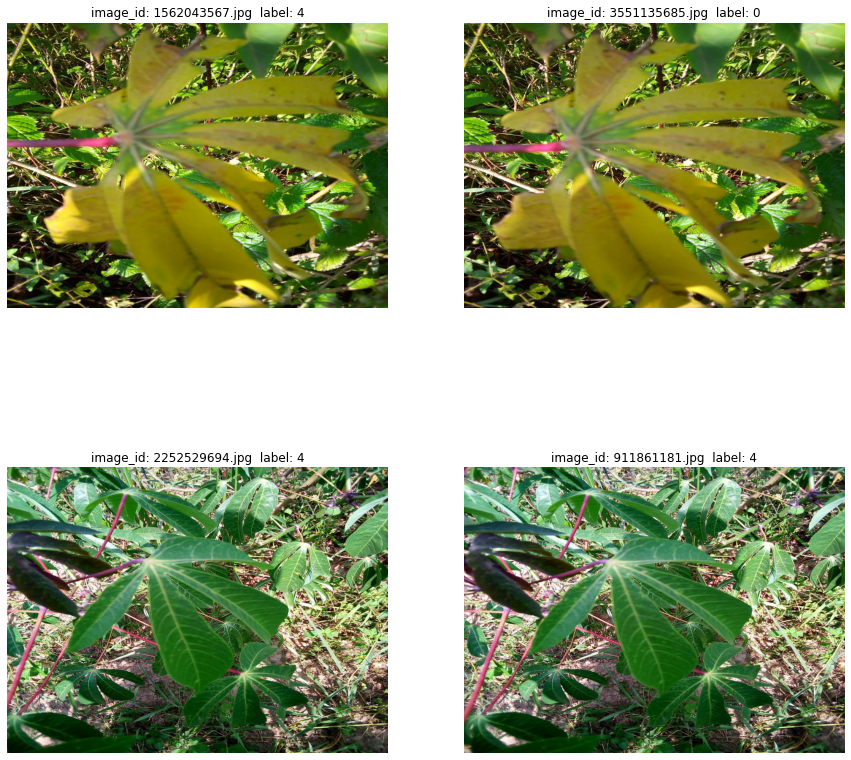

In [28]:
duplicate_image_ids = sorted(list(dups))

fig, axs = plt.subplots(2, 2, figsize=(15, 15))

for row in range(2):
    for col in range(2):
        img_id = duplicate_image_ids[row][col]
        img = Image.open(str(BASE_DIR/'train_images'/img_id))
        label = str(train.loc[train['image_id'] == img_id].label.values[0])
        axs[row, col].imshow(img)
        axs[row, col].set_title("image_id: " + img_id + "  label: " + label)
        axs[row, col].axis('off')

---

In [29]:
del model

### Configuration and utility functions

In [30]:
DIM = (384,384)

NUM_WORKERS = 12
TEST_BATCH_SIZE = 16
SEED = 2020

DEVICE = "cuda"

MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

### Augmentations

In [31]:
def get_test_transforms():

    return albumentations.Compose(
        [albumentations.Normalize(MEAN, STD, max_pixel_value=255.0, always_apply=True),
        ToTensorV2(p=1.0)
        ]
    )

## Cassava Dataset

In [32]:
class CassavaDataset(Dataset):
    def __init__(self,image_ids,labels,dimension=None,augmentations=None):
        super().__init__()
        self.image_ids = image_ids
        self.labels = labels
        self.dim = dimension
        self.augmentations = augmentations
        
    def __len__(self):
        return len(self.image_ids)
    
    def __getitem__(self,idx):
        '''
        cv2.imread()로 이미지를 읽으면 컬러이미지는 BGR 순서로 구성돼 있으므로
        cv2.cvtColor(img, cv2.COLOR_BGR2RGB)로 BGR에서 RGB로 변환해준다.
        '''
        img = cv2.imread(str(BASE_DIR/'test_images'/self.image_ids[idx]))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                         
        if self.dim:
            img = cv2.resize(img,self.dim)
        
        if self.augmentations:
            augmented = self.augmentations(image=img)
            image = augmented['image']
                         
        return {
            'image': image,
            'target': torch.tensor(self.labels[idx],dtype=torch.float)
        }

## Model: SE_Resnext50

In [33]:
print(timm.__version__)

0.1.26


In [34]:
model = timm.create_model('seresnext50_32x4d', pretrained=True)
n_features = model.last_linear.in_features

Downloading: "http://data.lip6.fr/cadene/pretrainedmodels/se_resnext50_32x4d-a260b3a4.pth" to /root/.cache/torch/hub/checkpoints/se_resnext50_32x4d-a260b3a4.pth


In [35]:
class CassavaModel(nn.Module):
    def __init__(self, model_name='seresnext50_32x4d',out_features=5,pretrained=True):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        
        n_features = self.model.last_linear.in_features
        self.model.last_linear = nn.Linear(n_features, out_features)

    def forward(self, x):
        x = self.model(x)
        return x

## Prediction Function Single Model

In [36]:
def predict_single_model(data_loader,model,device):
    model.eval()
    tk0 = tqdm(enumerate(data_loader), total=len(data_loader))
    fin_out = []
    
    with torch.no_grad():
        
        for bi, d in tk0:
            images = d['image']
            targets = d['target']
            
            images = images.to(device)
            targets = targets.to(device)
            
            batch_size = images.shape[0]
            
            outputs = model(images)
            
            fin_out.append(F.softmax(outputs, dim=1).detach().cpu().numpy())
            
    return np.concatenate(fin_out)

## Engine

In [37]:
sample_sub = pd.read_csv('../input/cassava-leaf-disease-classification/sample_submission.csv')

In [38]:
model = CassavaModel(out_features=5,pretrained=True)

In [39]:
def predict(weights):
    '''
    weights : List of paths in case of K fold model inference
    '''
    pred = np.zeros((len(sample_sub),5,5))
    
    # Defining DataSet
    test_dataset = CassavaDataset(
        image_ids=sample_sub['image_id'].values,
        labels=sample_sub['label'].values,
        augmentations=get_test_transforms(),
        dimension = DIM
    )
    
    test_loader = torch.utils.data.DataLoader(
        test_dataset,
        batch_size=TEST_BATCH_SIZE,
        num_workers=NUM_WORKERS,
        shuffle=False,
        pin_memory=True,
        drop_last=False,
    )
    
    # Defining Device
    device = torch.device("cpu")
    
    for i,weight in enumerate(weights):
        # Defining Model for specific fold
        model = CassavaModel(out_features=5,pretrained=True)
        
        # loading weights
        #model.load_state_dict(torch.load(weight))
        model.to(device)
        
        #predicting
        pred[:,:,i] = predict_single_model(test_loader,model,device)
    
    return pred

## Preparing Final Submission

In [40]:
pred = predict([1])
print(pred)

100%|██████████| 1/1 [00:01<00:00,  1.71s/it]

[[[0.21399316 0.         0.         0.         0.        ]
  [0.12603486 0.         0.         0.         0.        ]
  [0.3067295  0.         0.         0.         0.        ]
  [0.15876344 0.         0.         0.         0.        ]
  [0.19447912 0.         0.         0.         0.        ]]]


In [41]:
pred = pred.mean(axis=-1)
print('Prediction Before Argmax', pred)
pred = pred.argmax(axis=1)
print('Final Prediction', pred)

Prediction Before Argmax [[0.04279863 0.02520697 0.0613459  0.03175269 0.03889582]]
Final Prediction [2]


In [42]:
sample_sub['label'] = pred
sample_sub.head()

,image_id,label
0,2216849948.jpg,2


In [43]:
sample_sub.to_csv('submission.csv',index=False)